# Product Recommendation System



<br />
<center>
<img src="https://moosend.com/wp-content/uploads/2020/02/product-recommendations-hero.png" width="800" height="200" />
    
</center>

<br></br>


<center>Nikhil Kadam (001057873)</center>

<center>Malvika Kandpal (001057832)</center>

<center>Siddhant Modi (001349857)</center>

<center>Keerti Murugan (001393995)</center>



In [24]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [141]:
conda install tensorflow

Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\nikhi\AppData\Local\Continuum\anaconda3

  added / updated specs:
    - tensorflow


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    _tflow_select-2.3.0        |              mkl           3 KB
    absl-py-0.9.0              |           py37_0         168 KB
    astor-0.8.0                |           py37_0          47 KB
    blinker-1.4                |           py37_0          22 KB
    cachetools-4.1.1           |             py_0          12 KB
    conda-4.8.3                |           py37_0         2.8 MB
    gast-0.2.2                 |           py37_0         155 KB
 

In [3]:
#Importing all the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
import seaborn as sns
import re
import string
import sklearn
import os

from sklearn.neighbors import NearestNeighbors
from sklearn import neighbors
from scipy.spatial.distance import cosine
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from wordcloud import WordCloud, STOPWORDS
from sklearn.decomposition import TruncatedSVD
from keras.applications import vgg16
from keras.preprocessing.image import load_img,img_to_array
from keras.models import Model
from keras.applications.imagenet_utils import preprocess_input
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

plt.style.use("ggplot")


Using TensorFlow backend.


# Load the Dataset - Amazon Review dataset

In [4]:
pwd

'C:\\Users\\nikhi\\Downloads'

In [4]:
Product_Rate = pd.read_csv('Reviews.csv')

Product_Rate = Product_Rate.dropna()

Product_Rate.head(10)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...
5,6,B006K2ZZ7K,ADT0SRK1MGOEU,Twoapennything,0,0,4,1342051200,Nice Taffy,I got a wild hair for taffy and ordered this f...
6,7,B006K2ZZ7K,A1SP2KVKFXXRU1,David C. Sullivan,0,0,5,1340150400,Great! Just as good as the expensive brands!,This saltwater taffy had great flavors and was...
7,8,B006K2ZZ7K,A3JRGQVEQN31IQ,Pamela G. Williams,0,0,5,1336003200,"Wonderful, tasty taffy",This taffy is so good. It is very soft and ch...
8,9,B000E7L2R4,A1MZYO9TZK0BBI,R. James,1,1,5,1322006400,Yay Barley,Right now I'm mostly just sprouting this so my...
9,10,B00171APVA,A21BT40VZCCYT4,Carol A. Reed,0,0,5,1351209600,Healthy Dog Food,This is a very healthy dog food. Good for thei...


In [5]:
#Basic Information shape and columns
print(Product_Rate.columns)
print(Product_Rate.shape)

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text'],
      dtype='object')
(568411, 10)


In [6]:
Product_Rate.shape

(568411, 10)

In [7]:
#Find the minimum and maximum ratings
print('Minimum rating is: %d' %(Product_Rate.Score.min()))
print('Maximum rating is: %d' %(Product_Rate.Score.max()))

Minimum rating is: 1
Maximum rating is: 5


C:\Users\nikhi\AppData\Local\Continuum\anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


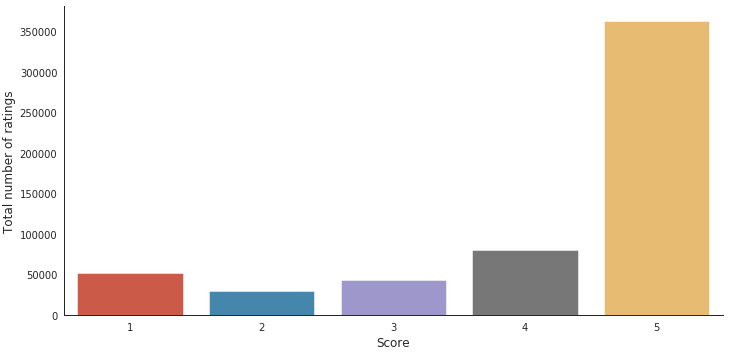

In [8]:
# Check the distribution of the Score
with sns.axes_style('white'):
    g = sns.factorplot("Score", data=Product_Rate, aspect=2.0,kind='count')
    g.set_ylabels("Total number of ratings")

In [9]:
print("Total data ")
print("-"*50)
print("\nTotal no of ratings :",Product_Rate.shape[0])
print("Total No of Users   :", len(np.unique(Product_Rate.UserId)))
print("Total No of products  :", len(np.unique(Product_Rate.ProductId)))

Total data 
--------------------------------------------------

Total no of ratings : 568411
Total No of Users   : 256047
Total No of products  : 74258


# Popularity Based Recommendation

**Find top 10 Popular Products**


In [10]:
popular_p = pd.DataFrame(Product_Rate.groupby('ProductId')['Score'].count())
most_popular = popular_p.sort_values('Score', ascending=False)
most_popular.head(10)

,Score
ProductId,
B007JFMH8M,913
B0026RQTGE,632
B002QWP8H0,632
B002QWHJOU,632
B002QWP89S,632
B003B3OOPA,623
B001EO5Q64,567
B001RVFERK,564
B0026KNQSA,564



The graph gives us the most popular products (arranged in descending order) sold by the business.

For eaxmple, product, ID # B007JFMH8M has sales of over 900, the next most popular product, ID # B0026RQTGE has sales of 600, etc


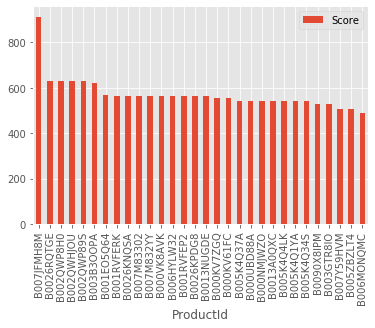

In [11]:
most_popular.head(30).plot(kind = "bar")

In [12]:
#Getting the new dataframe which contains users who has given 50 or more ratings

new_df=Product_Rate.groupby("ProductId").filter(lambda x:x['Score'].count() >=50)

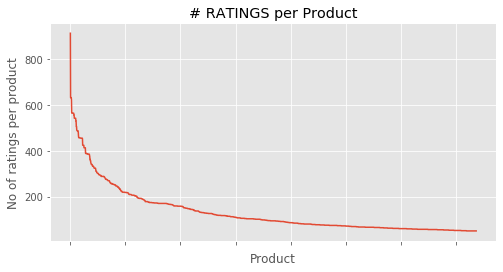

In [13]:
no_of_ratings_per_product = new_df.groupby(by='ProductId')['Score'].count().sort_values(ascending=False)

fig = plt.figure(figsize=plt.figaspect(.5))
ax = plt.gca()
plt.plot(no_of_ratings_per_product.values)
plt.title('# RATINGS per Product')
plt.xlabel('Product')
plt.ylabel('No of ratings per product')
ax.set_xticklabels([])

plt.show()

In [14]:
#Average rating of the product 
new_df.groupby('ProductId')['Score'].mean().sort_values(ascending=False).head()

ProductId
B000ED9L9E    4.973451
B000O5DI1E    4.906542
B001E6GFKI    4.887500
B000NMJWZO    4.881919
B0044MTGHI    4.880000
Name: Score, dtype: float64

In [15]:
ratings_mean_count = pd.DataFrame(new_df.groupby('ProductId')['Score'].mean())
ratings_mean_count['rating_counts'] = pd.DataFrame(new_df.groupby('ProductId')['Score'].count())
ratings_mean_count.head()

,Score,rating_counts
ProductId,,
7310172001,4.751445,173
7310172101,4.751445,173
B00004CI84,4.486772,189
B00004CXX9,4.405128,195
B00004RAMY,4.104651,172


In [16]:
ratings_mean_count['rating_counts'].min()

50

**The graphs below shows the rating counts of the scores provided by the user for the products**

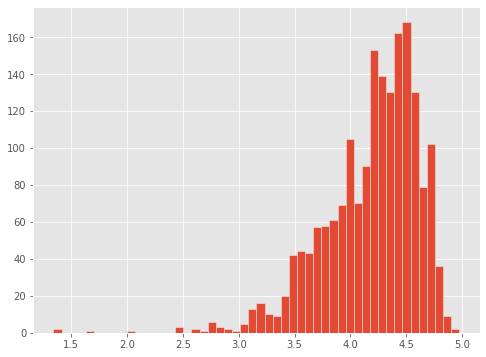

In [17]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor'] = True
ratings_mean_count['Score'].hist(bins=50)

<Figure size 576x432 with 0 Axes>

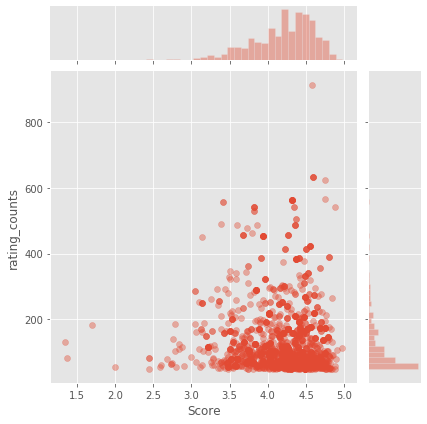

In [18]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor'] = True
sns.jointplot(x='Score', y='rating_counts', data=ratings_mean_count, alpha=0.4)

# Collaborative filtering recommendation system
Model-based collaborative filtering system
Recommend items to users based on purchase history and similarity of ratings provided by other users who bought items to that of a particular customer.

A model based collaborative filtering technique is closen here as it helps in making predictinfg products for a particular user by identifying patterns based on preferences from multiple user data.

Utility Matrix based on products sold and user reviews
Utility Matrix

An utlity matrix is consists of all possible user-item preferences (ratings) details represented as a matrix. The utility matrix is sparce as none of the users would buy all teh items in the list, hence, most of the values are unknown.

In [19]:

# Subset of product Ratings

Product_Rate1 = Product_Rate.head(10000)

In [20]:
ratings_utility_matrix = Product_Rate1.pivot_table(values='Score', index='UserId', columns='ProductId', fill_value=0)
ratings_utility_matrix.head()

ProductId,B00002NCJC,B00002Z754,B00005V3DC,B000084DVR,B000084E1U,B000084EK4,B000084EK5,B000084EK6,B000084EK7,B000084EK8,...,B0092XAMDQ,B0093NIWVO,B00959DMWK,B00961CUXO,B0096E5196,B009AVDFCK,B009D668KS,B009HINRX8,B009UOFU20,B009WSNWC4
UserId,,,,,,,,,,,,,,,,,,,,,
A10012K7DF3SBQ,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1001TYW5FZYD9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1008DPSP6KC9J,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A101C99CG8EFUH,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A102XKYZE9Q9L4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


As expected, the utility matrix obtaned above is sparce, we have filled up the unknown values wth 0.

In [21]:

ratings_utility_matrix.shape

(9015, 1422)

Transposing the matrix

In [22]:
X = ratings_utility_matrix.T
X.head()

UserId,A10012K7DF3SBQ,A1001TYW5FZYD9,A1008DPSP6KC9J,A101C99CG8EFUH,A102XKYZE9Q9L4,A10317LUD1C1VJ,A10389F7LRIZWQ,A103EZCS9H8WW1,A103U3KR4L2ZXT,A104Y49ZQ4CYJ2,...,AZTEQJCI6N5WL,AZTITR4RTA1Y,AZV26LP92E6WU,AZVQMPXZEHQGZ,AZVR7NPPEDMMN,AZWC23X2AZAQC,AZWWYWR908X25,AZX7EZIIFMFI7,AZYJE40XW6MFG,AZZ7SCDDZR0R3
ProductId,,,,,,,,,,,,,,,,,,,,,
B00002NCJC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00002Z754,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B00005V3DC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B000084DVR,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B000084E1U,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:

X.shape

(1422, 9015)

Unique products in subset of data

In [24]:
X1 = X

Decomposing the Matrix

In [25]:
SVD = TruncatedSVD(n_components=10)
decomposed_matrix = SVD.fit_transform(X)
decomposed_matrix.shape

(1422, 10)

Correlation Matrix

In [26]:
correlation_matrix = np.corrcoef(decomposed_matrix)
correlation_matrix.shape

(1422, 1422)

Isolating Product ID # B0006J6GWG from the Correlation Matrix
Assuming the customer buys Product ID # B0006J6GWG (randomly chosen)



In [27]:
X.index[99]


'B0006J6GWG'

Index # of product ID purchased by customer

In [28]:
i = "B0006J6GWG"

product_names = list(X.index)
product_ID = product_names.index(i)
product_ID

99

Correlation for all items with the item purchased by this customer based on items rated by other customers people who bought the same product

In [29]:
correlation_product_ID = correlation_matrix[product_ID]
correlation_product_ID.shape

(1422,)

In [30]:
#compute the count and mean value as group by the products
count = Product_Rate.groupby("ProductId", as_index=False).count()
mean = Product_Rate.groupby("ProductId", as_index=False).mean()

#merge two dataset create df1
df1 = pd.merge(Product_Rate, count, how='right', on=['ProductId'])

In [31]:
#rename column
df1["Count"] = df1["UserId_y"]
df1["Score"] = df1["Score_x"]
df1["Summary"] = df1["Summary_x"]

#Create New datafram with selected variables
df1 = df1[['ProductId','Summary','Score',"Count"]]

In [32]:
#choose only products have over 100 reviews
df1 = df1.sort_values(by=['Count'], ascending=False)
df2 = df1[df1.Count >= 100]

In [33]:
#create new dataframe as combining all summary with same product Id
df4 = Product_Rate.groupby("ProductId", as_index=False).mean()
combine_summary = df2.groupby("ProductId")["Summary"].apply(list)
combine_summary = pd.DataFrame(combine_summary)
combine_summary.to_csv("combine_summary.csv")

In [34]:
#create with certain columns
df3 = pd.read_csv("combine_summary.csv")
df3 = pd.merge(df3, df4, on="ProductId", how='inner')
df3 = df3[['ProductId','Summary','Score']]

Text Clean process - Summary column

In [35]:
#function for tokenizing summary
cleanup_re = re.compile('[^a-z]+')
def cleanup(sentence):
    sentence = sentence.lower()
    sentence = cleanup_re.sub(' ', sentence).strip()
    sentence = " ".join(nltk.word_tokenize(sentence))
    return sentence

In [36]:
#reset index and drop duplicate rows
df3["Summary_Clean"] = df3["Summary"].dropna()
df3 = df3.drop_duplicates(['Score'], keep='last')
df3 = df3.reset_index()

In [37]:
from pandas import DataFrame 

docs = df3["Summary_Clean"] 
vect = CountVectorizer(max_features = 100, stop_words='english') 
X = vect.fit_transform(docs) 

df5 = DataFrame(X.A, columns=vect.get_feature_names())
df5 = df5.astype(int)

In [38]:
#save 
df5.to_csv("df5.csv")

In [39]:
# First let's create a dataset called X
X = np.array(df5)
 # create train and test
tpercent = 0.9
tsize = int(np.floor(tpercent * len(df5)))
df5_train = X[:tsize]
df5_test = X[tsize:]
#len of train and test
lentrain = len(df5_train)
lentest = len(df5_test)

KNN classifier to find similar products

In [40]:
# Next we will instantiate a nearest neighbor object, and call it nbrs. Then we will fit it to dataset X.
nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(df5_train)

# Let's find the k-neighbors of each point in object X. To do that we call the kneighbors() function on object X.
distances, indices = nbrs.kneighbors(df5_train)

In [41]:
#find most related products
for i in range(lentest):
    a = nbrs.kneighbors([df5_test[i]])
    related_product_list = a[1]
    
    first_related_product = [item[0] for item in related_product_list]
    first_related_product = str(first_related_product).strip('[]')
    first_related_product = int(first_related_product)
    second_related_product = [item[1] for item in related_product_list]
    second_related_product = str(second_related_product).strip('[]')
    second_related_product = int(second_related_product)
    
    print ("Based on product reviews, for ", df3["ProductId"][lentrain + i] ," and this average Score is ",df3["Score"][lentrain + i])
    print ("The first similar product is ", df3["ProductId"][first_related_product] ," and this average Score is ",df3["Score"][first_related_product])
    print ("The second similar product is ", df3["ProductId"][second_related_product] ," and this average Score is ",df3["Score"][second_related_product])
    print ("-----------------------------------------------------------")

Based on product reviews, for  B007TGDXMU  and this average Score is  4.517006802721088
The first similar product is  B005ZBZLPI  and this average Score is  4.0
The second similar product is  B000SDKDM4  and this average Score is  4.08252427184466
-----------------------------------------------------------
Based on product reviews, for  B007TGDXNO  and this average Score is  4.3478260869565215
The first similar product is  B007TGDXMK  and this average Score is  4.143540669856459
The second similar product is  B00451WLYI  and this average Score is  4.517647058823529
-----------------------------------------------------------
Based on product reviews, for  B007TJGY5K  and this average Score is  4.119496855345912
The first similar product is  B007L3NVKU  and this average Score is  4.355072463768116
The second similar product is  B0027Z8VES  and this average Score is  4.341269841269841
-----------------------------------------------------------
Based on product reviews, for  B007TJGZ0Y  an

Predicting Review Score

In [42]:
df5_train_target = df3["Score"][:lentrain]
df5_test_target = df3["Score"][lentrain:lentrain+lentest]
df5_train_target = df5_train_target.astype(int)
df5_test_target = df5_test_target.astype(int)

n_neighbors = 3
knnclf = neighbors.KNeighborsClassifier(n_neighbors, weights='distance')
knnclf.fit(df5_train, df5_train_target)
knnpreds_test = knnclf.predict(df5_test)
print (knnpreds_test)

print(classification_report(df5_test_target, knnpreds_test))
print (accuracy_score(df5_test_target, knnpreds_test))

[4 4 4 3 4 4 3 3 3 4 4 3 3 3 4 4 4 3 3 3 4 3 4 3 4 3 4 4 4 4 4 4 3 4 3 4 3]
              precision    recall  f1-score   support

           3       0.50      0.80      0.62        10
           4       0.90      0.70      0.79        27

    accuracy                           0.73        37
   macro avg       0.70      0.75      0.70        37
weighted avg       0.80      0.73      0.74        37

0.7297297297297297


2. User based collaborative filtering

In [43]:
count = Product_Rate.groupby("UserId", as_index=False).count()
mean = Product_Rate.groupby("UserId", as_index=False).mean()

#merge two dataset create df1
df1 = pd.merge(Product_Rate, count, how='right', on=["UserId"])
#rename column
df1["Count"] = df1["ProductId_y"]
df1["Score"] = df1["Score_x"]
df1["Summary"] = df1["Summary_x"]

#Create New datafram with selected variables
df1 = df1[["UserId",'Summary','Score',"Count"]]

In [44]:
#choose only products have over 100 reviews
df1 = df1.sort_values(by=['Count'], ascending=False)
df2 = df1[df1.Count >= 100]

In [45]:
df4 = Product_Rate.groupby("UserId", as_index=False).mean()
combine_summary = df2.groupby("UserId")["Summary"].apply(list)
combine_summary = pd.DataFrame(combine_summary)
combine_summary.to_csv("combine_summary.csv")

In [46]:
df3 = pd.read_csv("combine_summary.csv")
df3 = pd.merge(df3, df4, on="UserId", how='inner')
df3 = df3[['UserId','Summary','Score']]

In [47]:
df3["Summary_Clean"] = df3["Summary"].dropna()

In [48]:
df3 = df3.drop_duplicates(['Score'], keep='last')
df3 = df3.reset_index()

In [49]:

from pandas import DataFrame 
from sklearn.feature_extraction.text import CountVectorizer 
docs = df3["Summary_Clean"] 
vect = CountVectorizer(max_features = 100, stop_words='english') 
X = vect.fit_transform(docs) 
#print(DataFrame(X.A, columns=vect.get_feature_names()).to_string()) 
df5 = DataFrame(X.A, columns=vect.get_feature_names())
df5 = df5.astype(int)


In [50]:
df5.to_csv("df5.csv")
kkk  = Product_Rate.drop_duplicates(['Summary'], keep='last')
kkk = kkk.reset_index()

KNN classifier to find similar user and find their interesting products

In [51]:
# First let's create a dataset called X, with 6 records and 2 features each.
X = np.array(df5)

tpercent = 0.95
tsize = int(np.floor(tpercent * len(df5)))
df5_train = X[:tsize]
df5_test = X[tsize:]

lentrain = len(df5_train)
lentest = len(df5_test)

# Next we will instantiate a nearest neighbor object, and call it nbrs. Then we will fit it to dataset X.
nbrs = NearestNeighbors(n_neighbors=3, algorithm='ball_tree').fit(df5_train)

# Let's find the k-neighbors of each point in object X. To do that we call the kneighbors() function on object X.
distances, indices = nbrs.kneighbors(df5_train)

# Word Cloud - Word correltation based on cluster

In [52]:
cluster = Product_Rate.groupby("Score")["Summary"].apply(list)

In [53]:
cluster = pd.DataFrame(cluster)
cluster.to_csv("cluster.csv")
cluster1 = pd.read_csv("cluster.csv")

In [54]:
cluster1["Summary_Clean"] = cluster1["Summary"].dropna()

**World Clouding for Each Score Group**

In [55]:
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=500,
        max_font_size=30, 
        scale=3,
        random_state=1 # chosen at random by flipping a coin; it was heads
    ).generate(str(data))
    
    fig = plt.figure(1, figsize=(8, 8))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

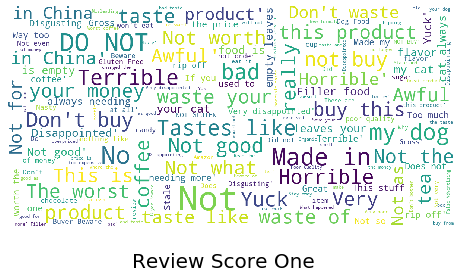

In [56]:
show_wordcloud(cluster1["Summary_Clean"][0], title = "Review Score One")

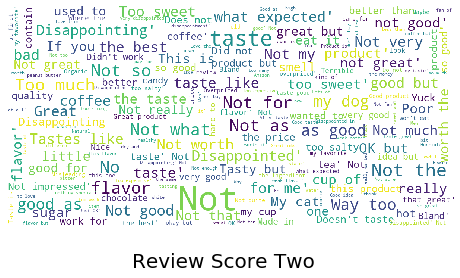

In [57]:
show_wordcloud(cluster1["Summary_Clean"][1] , title = "Review Score Two")

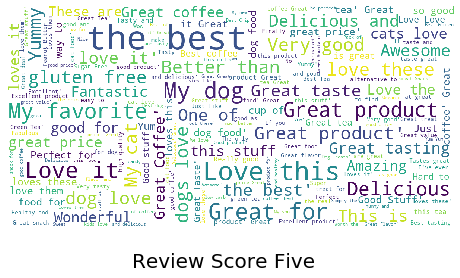

In [58]:

show_wordcloud(cluster1["Summary_Clean"][4], title = "Review Score Five")

# Cluster based recommendation system
For a business without any user-item purchase history, a search engine based recommendation system can be designed for users. The product recommendations can be based on textual clustering analysis given in product description.

In [63]:

# Importing libraries

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [64]:
product_descriptions = pd.read_csv('product_descriptions.csv')
product_descriptions.shape

(124428, 2)

Checking for missing values

In [65]:
# Missing values

product_descriptions = product_descriptions.dropna()
product_descriptions.shape
product_descriptions.head()

,product_uid,product_description
0,100001,"Not only do angles make joints stronger, they ..."
1,100002,BEHR Premium Textured DECKOVER is an innovativ...
2,100003,Classic architecture meets contemporary design...
3,100004,The Grape Solar 265-Watt Polycrystalline PV So...
4,100005,Update your bathroom with the Delta Vero Singl...


In [66]:
product_descriptions1 = product_descriptions.head(500)
# product_descriptions1.iloc[:,1]

product_descriptions1["product_description"].head(10)

0    Not only do angles make joints stronger, they ...
1    BEHR Premium Textured DECKOVER is an innovativ...
2    Classic architecture meets contemporary design...
3    The Grape Solar 265-Watt Polycrystalline PV So...
4    Update your bathroom with the Delta Vero Singl...
5    Achieving delicious results is almost effortle...
6    The Quantum Adjustable 2-Light LED Black Emerg...
7    The Teks #10 x 1-1/2 in. Zinc-Plated Steel Was...
8    Get the House of Fara 3/4 in. x 3 in. x 8 ft. ...
9    Valley View Industries Metal Stakes (4-Pack) a...
Name: product_description, dtype: object

Feature extraction from product descriptions¶
Converting the text in product description into numerical data for analysis

In [67]:
vectorizer = TfidfVectorizer(stop_words='english')
X1 = vectorizer.fit_transform(product_descriptions1["product_description"])
X1

<500x8932 sparse matrix of type '<class 'numpy.float64'>'
	with 34817 stored elements in Compressed Sparse Row format>

Visualizing product clusters in subset of data

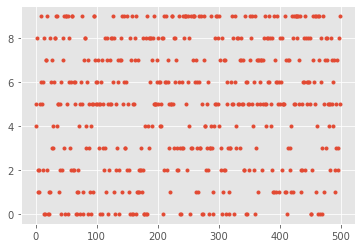

In [68]:
# Fitting K-Means to the dataset

X=X1

kmeans = KMeans(n_clusters = 10, init = 'k-means++')
y_kmeans = kmeans.fit_predict(X)
plt.plot(y_kmeans, ".")
plt.show()

In [69]:
def print_cluster(i):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind]),
    print

Output
Recommendation of product based on the current product selected by user.
To recommend related product based on, Frequently bought together.




Top words in each cluster based on product description

In [70]:
# # Optimal clusters is 

true_k = 10

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X1)

print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(true_k):
    print_cluster(i)

Top terms per cluster:
Cluster 0:
 cooking
 oven
 cu
 cycle
 wash
 ft
 capacity
 drawer
 large
 options
Cluster 1:
 air
 control
 helps
 easy
 power
 cooling
 fan
 protection
 features
 snow
Cluster 2:
 light
 tool
 power
 watt
 volt
 led
 use
 lbs
 easy
 grip
Cluster 3:
 wood
 door
 paint
 vary
 painted
 ft
 proposition
 nbsp
 residents
 california
Cluster 4:
 insulation
 attic
 ladder
 ft
 radiant
 energy
 fiberglass
 access
 cover
 aluminum
Cluster 5:
 piece
 toilet
 bowl
 flush
 collection
 patio
 frame
 dining
 cushions
 white
Cluster 6:
 window
 basement
 screen
 shades
 windows
 covers
 natural
 cutting
 furniture
 roller
Cluster 7:
 post
 landscape
 fence
 used
 ft
 tree
 natural
 concrete
 edging
 beds
Cluster 8:
 water
 wall
 heater
 metal
 use
 easy
 warranty
 year
 spray
 provides
Cluster 9:
 cabinet
 36
 cut
 aluminum
 sheet
 repair
 pull
 nickel
 finish
 32


Predicting clusters based on key search words

In [71]:
def show_recommendations(product):
    #print("Cluster ID:")
    Y = vectorizer.transform([product])
    prediction = model.predict(Y)
    #print(prediction)
    print_cluster(prediction[0])

Keyword : Cutting tool

In [72]:
show_recommendations("cutting tool")

Cluster 2:
 light
 tool
 power
 watt
 volt
 led
 use
 lbs
 easy
 grip


Keyword : spray paint

In [73]:
show_recommendations("spray paint")

Cluster 3:
 wood
 door
 paint
 vary
 painted
 ft
 proposition
 nbsp
 residents
 california


Keyword : steel drill

In [74]:
show_recommendations("steel drill")

Cluster 2:
 light
 tool
 power
 watt
 volt
 led
 use
 lbs
 easy
 grip


In case a word appears in multiple clusters, the algorithm chooses the cluster with the highest frequency of occurance of the word.



Keyword : water

In [75]:
show_recommendations("water")

Cluster 8:
 water
 wall
 heater
 metal
 use
 easy
 warranty
 year
 spray
 provides


Once a cluster is identified based on the user's search words, the recommendation system can display items from the corresponding product clusters based on the product descriptions.

# Product Recommender based on visual similarity 

In [76]:
# parameters setup

imgs_path = "train"

imgs_model_width, imgs_model_height = 224, 224

nb_closest_images = 5 # number of most similar images to retrieve

In [77]:
vgg_model = vgg16.VGG16(weights='imagenet')

# remove the last layers in order to get features instead of predictions
feat_extractor = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)

# print the layers of the CNN
feat_extractor.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0   

In [78]:
# List of training Images
files = [imgs_path + '/' + x for x in os.listdir(imgs_path) if "jpg" in x]
print("Number of Images:",len(files))

Number of Images: 1205


In [79]:
# Coverting and preprcessing Images and returning a feature set using the Neural Network
def preprocessimg(testpath):
    importedImages = []

    for f in testpath:
        filename = f
        original = load_img(filename, target_size=(224, 224))
        numpy_image = img_to_array(original)
        image_batch = np.expand_dims(numpy_image, axis=0)
        importedImages.append(image_batch)
    
    images = np.vstack(importedImages)
    processed_imgs = preprocess_input(images.copy())
    # extract the images features
    imgs_features = feat_extractor.predict(processed_imgs)
    return imgs_features

In [80]:
def findcossim(X,Y,files_te):
    # compute cosine similarities between images
    cosSimilarities = cosine_similarity(X, Y)
    # store the results into a pandas dataframe
    cos_similarities_df = pd.DataFrame(cosSimilarities,columns=files_te,index=files)
    return cos_similarities_df

In [81]:
def retrieve_most_similar_products(given_img,cos_similarities_df):
    print("-----------------------------------------------------------------------")
    print("Original Product:")

    original = load_img(given_img, target_size=(imgs_model_width, imgs_model_height))
    plt.imshow(original)
    plt.show()

    print("-----------------------------------------------------------------------")
    print("Most Similar Products:")

    
    closest_imgs = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1].index
    closest_imgs_scores = cos_similarities_df[given_img].sort_values(ascending=False)[1:nb_closest_images+1]

    for i in range(0,len(closest_imgs)):
        original = load_img(closest_imgs[i], target_size=(imgs_model_width, imgs_model_height))
        plt.imshow(original)
        plt.show()
        print("Similarity score : ",closest_imgs_scores[i])

In [82]:
def findallsim(files_test):
    for i in range(len(files_test)):
        retrieve_most_similar_products(files_test[i],cos_similarities_df)

# Traning the network

In [83]:
X=preprocessimg(files)
X.shape

(1205, 4096)

# Getting test Images Using the categories¶

In [154]:
def choosecat(Category):
    imgs_path_test = "test/"+Category
    files_test = [imgs_path_test + '/' + x for x in os.listdir(imgs_path_test) if "jpeg" or 'jpg' in x]
    print("number of images:",len(files_test))
    return files_test

# Shoes

In [155]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test1=choosecat('Shoes')
test_image_features=preprocessimg(files_test1)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test1)
cos_similarities_df.head()

number of images: 5


,test/Shoes/134.jpg,test/Shoes/71.jpg,test/Shoes/WhatsApp Image 2020-08-07 at 2.24.03 PM.jpeg,test/Shoes/WhatsApp Image 2020-08-07 at 2.24.22 PM.jpeg,test/Shoes/WhatsApp Image 2020-08-07 at 2.40.05 PM (2).jpeg
train/1.jpg,0.216433,0.158395,0.149138,0.190247,0.235273
train/10.jpg,0.165059,0.160339,0.192947,0.196167,0.156636
train/100.jpg,0.585560,0.517261,0.411528,0.367861,0.460731
train/1003.jpg,0.308580,0.270025,0.268588,0.223499,0.230482
train/1004.jpg,0.218461,0.239656,0.416357,0.322502,0.270712


-----------------------------------------------------------------------
Original Product:


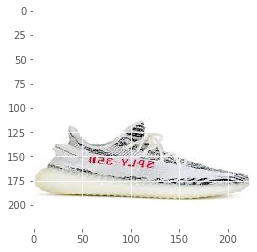

-----------------------------------------------------------------------
Most Similar Products:


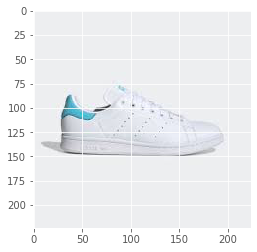

Similarity score :  0.82867616


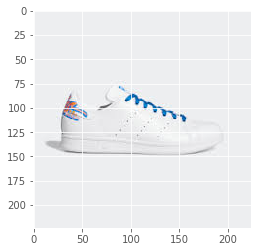

Similarity score :  0.81702673


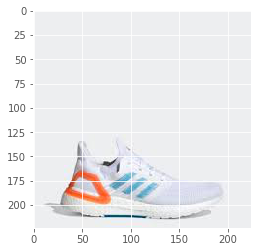

Similarity score :  0.81120175


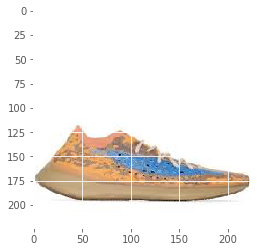

Similarity score :  0.7940882


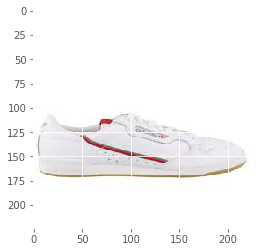

Similarity score :  0.78388435
-----------------------------------------------------------------------
Original Product:


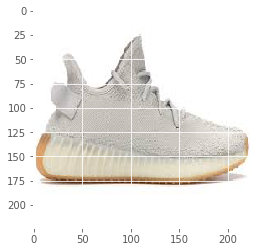

-----------------------------------------------------------------------
Most Similar Products:


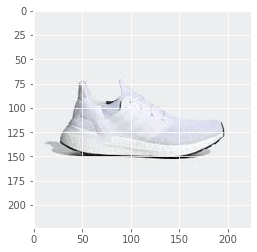

Similarity score :  0.76957667


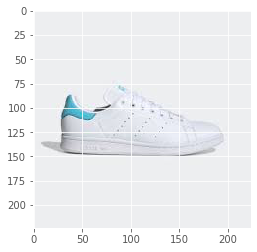

Similarity score :  0.76494336


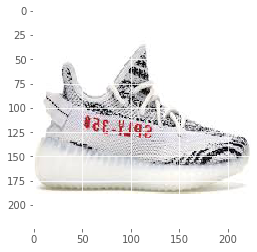

Similarity score :  0.75962335


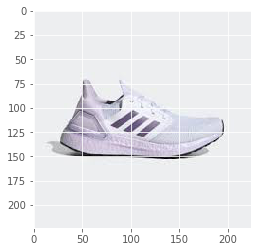

Similarity score :  0.75691926


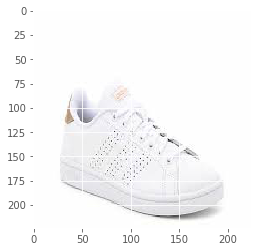

Similarity score :  0.7398267
-----------------------------------------------------------------------
Original Product:


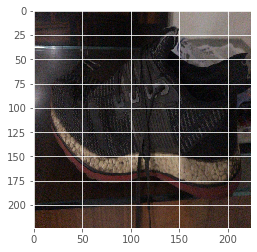

-----------------------------------------------------------------------
Most Similar Products:


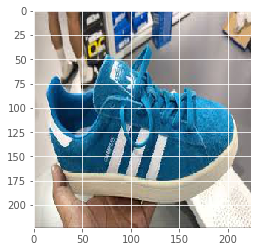

Similarity score :  0.49859017


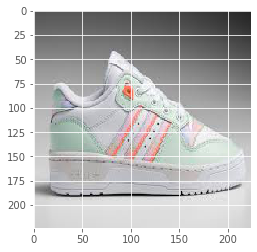

Similarity score :  0.49036184


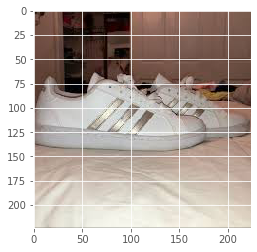

Similarity score :  0.48939604


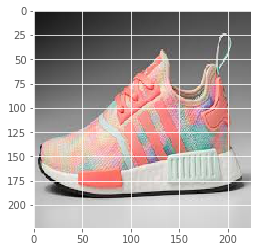

Similarity score :  0.48049662


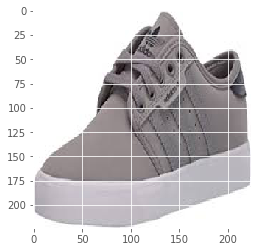

Similarity score :  0.47951397
-----------------------------------------------------------------------
Original Product:


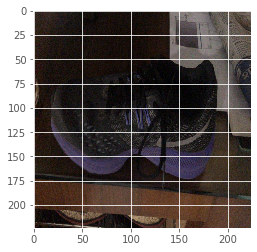

-----------------------------------------------------------------------
Most Similar Products:


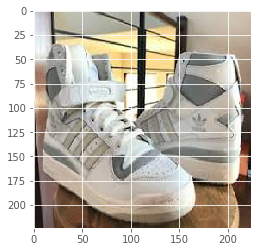

Similarity score :  0.48655042


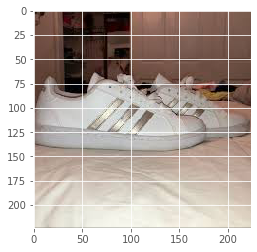

Similarity score :  0.4680138


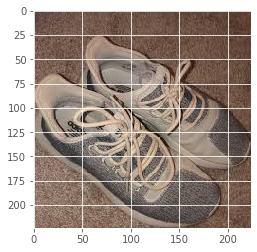

Similarity score :  0.44837162


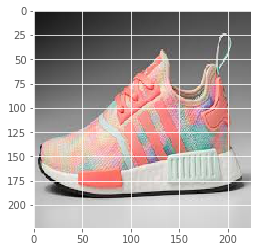

Similarity score :  0.43357083


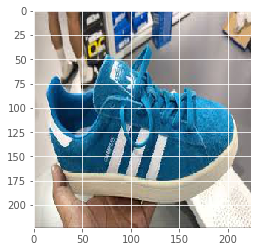

Similarity score :  0.43134326
-----------------------------------------------------------------------
Original Product:


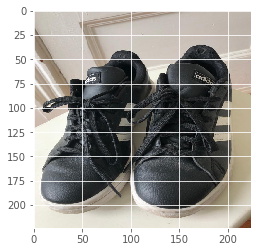

-----------------------------------------------------------------------
Most Similar Products:


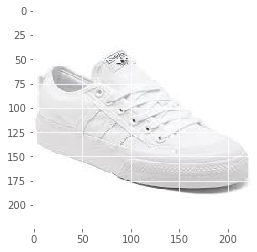

Similarity score :  0.64738876


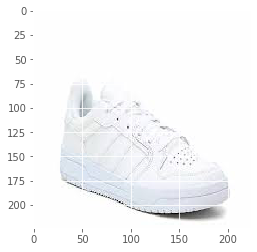

Similarity score :  0.6162996


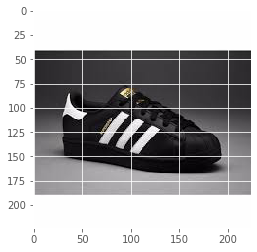

Similarity score :  0.6152716


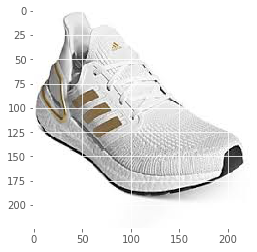

Similarity score :  0.5903363


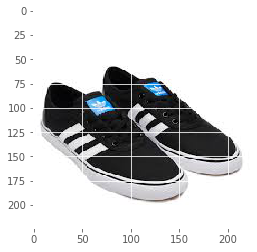

Similarity score :  0.58776134


In [156]:
findallsim(files_test1)

# Watches

In [157]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test2=choosecat('Watches')
test_image_features=preprocessimg(files_test2)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test2)
cos_similarities_df.head()

number of images: 5


,test/Watches/3.jpg,test/Watches/4.jpg,test/Watches/WhatsApp Image 2020-08-07 at 2.23.41 PM (2).jpeg,test/Watches/WhatsApp Image 2020-08-07 at 2.23.41 PM.jpeg,test/Watches/WhatsApp Image 2020-08-07 at 2.40.05 PM (1).jpeg
train/1.jpg,0.725887,0.481870,0.194699,0.222825,0.224774
train/10.jpg,0.269271,0.432574,0.585100,0.543573,0.597450
train/100.jpg,0.253562,0.200982,0.224389,0.189473,0.157672
train/1003.jpg,0.281917,0.199246,0.252177,0.153224,0.151609
train/1004.jpg,0.144935,0.117072,0.273969,0.159830,0.131665


-----------------------------------------------------------------------
Original Product:


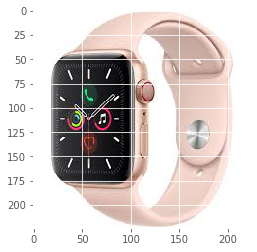

-----------------------------------------------------------------------
Most Similar Products:


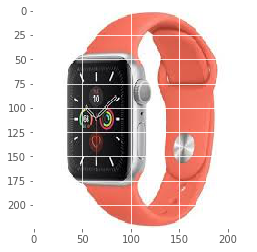

Similarity score :  0.8060805


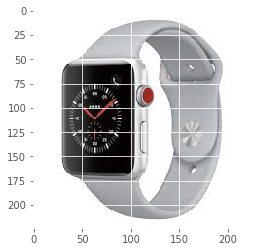

Similarity score :  0.7869036


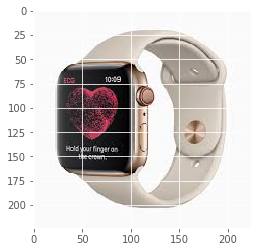

Similarity score :  0.7751895


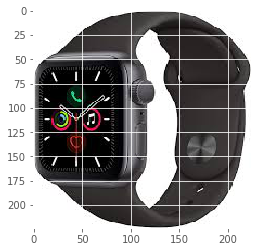

Similarity score :  0.7634016


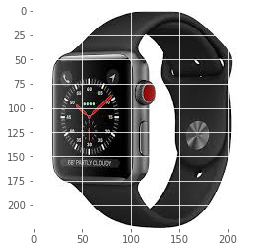

Similarity score :  0.7469084
-----------------------------------------------------------------------
Original Product:


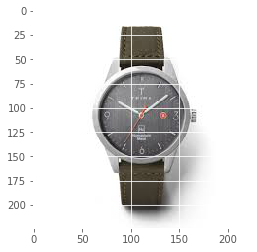

-----------------------------------------------------------------------
Most Similar Products:


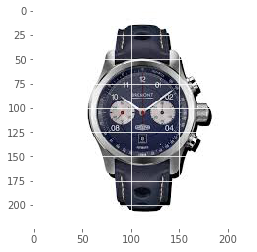

Similarity score :  0.7903874


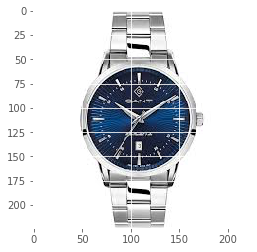

Similarity score :  0.7459591


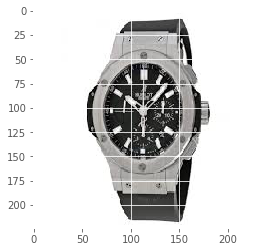

Similarity score :  0.7394788


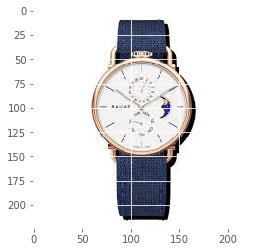

Similarity score :  0.72851306


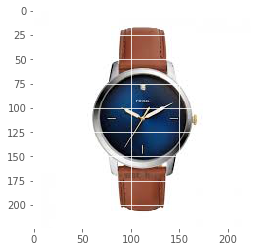

Similarity score :  0.7196173
-----------------------------------------------------------------------
Original Product:


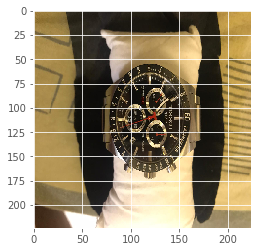

-----------------------------------------------------------------------
Most Similar Products:


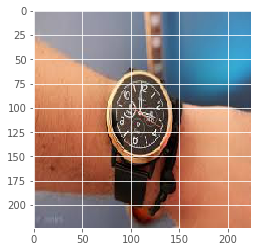

Similarity score :  0.5851004


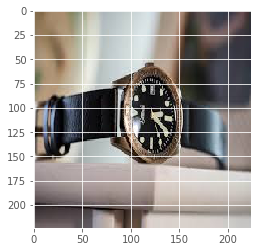

Similarity score :  0.5752797


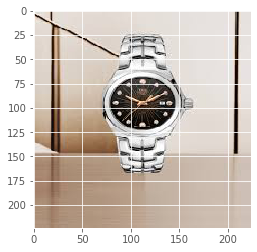

Similarity score :  0.57257074


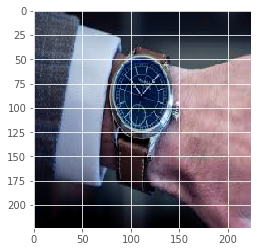

Similarity score :  0.5410904


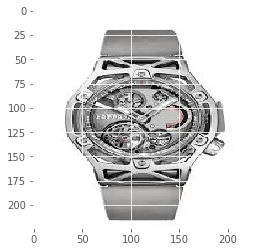

Similarity score :  0.5387152
-----------------------------------------------------------------------
Original Product:


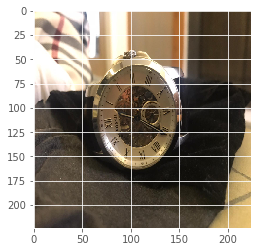

-----------------------------------------------------------------------
Most Similar Products:


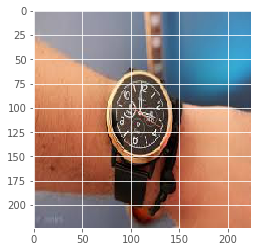

Similarity score :  0.54357255


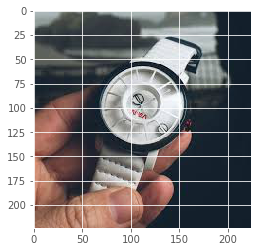

Similarity score :  0.5112962


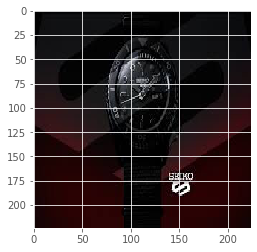

Similarity score :  0.5099458


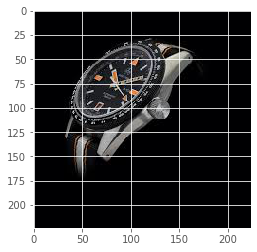

Similarity score :  0.5072369


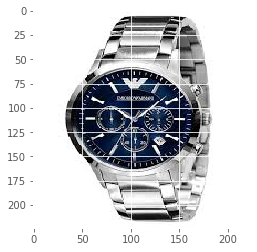

Similarity score :  0.5003256
-----------------------------------------------------------------------
Original Product:


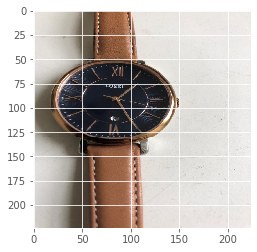

-----------------------------------------------------------------------
Most Similar Products:


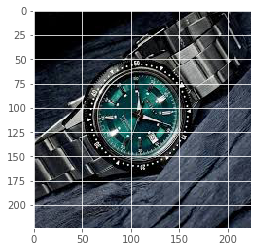

Similarity score :  0.61564255


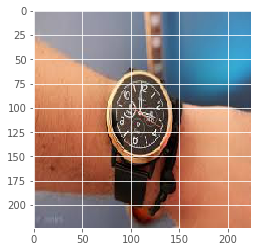

Similarity score :  0.59745044


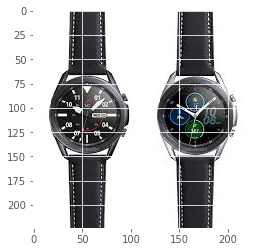

Similarity score :  0.58970636


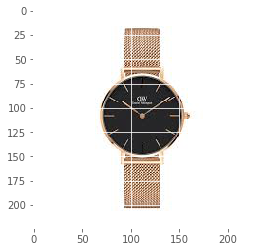

Similarity score :  0.5775405


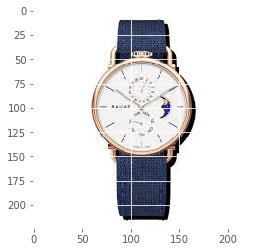

Similarity score :  0.5660605


In [158]:
findallsim(files_test2)

# Wallets

In [159]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test3=choosecat('Wallets')
test_image_features=preprocessimg(files_test3)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test3)
cos_similarities_df.head()

number of images: 5


,test/Wallets/354.jpg,test/Wallets/355.jpg,test/Wallets/WhatsApp Image 2020-08-07 at 1.30.39 PM.jpeg,test/Wallets/WhatsApp Image 2020-08-07 at 1.31.36 PM.jpeg,test/Wallets/WhatsApp Image 2020-08-07 at 2.23.39 PM.jpeg
train/1.jpg,0.275266,0.183058,0.166962,0.222592,0.231055
train/10.jpg,0.208319,0.207389,0.280832,0.250245,0.269465
train/100.jpg,0.361952,0.420288,0.305003,0.288287,0.264348
train/1003.jpg,0.283557,0.306817,0.170413,0.173150,0.253163
train/1004.jpg,0.274279,0.334431,0.166171,0.213039,0.268623


-----------------------------------------------------------------------
Original Product:


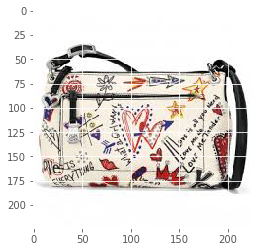

-----------------------------------------------------------------------
Most Similar Products:


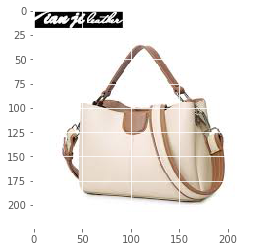

Similarity score :  0.5224691


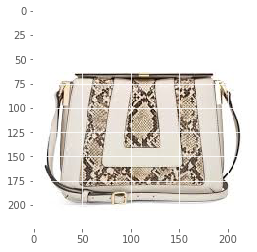

Similarity score :  0.5124811


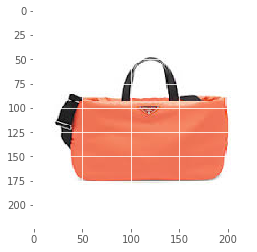

Similarity score :  0.5063938


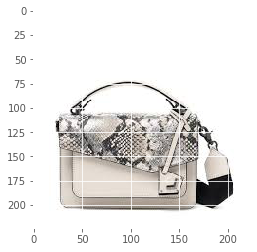

Similarity score :  0.50003576


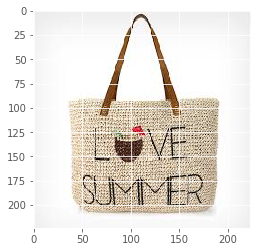

Similarity score :  0.49149057
-----------------------------------------------------------------------
Original Product:


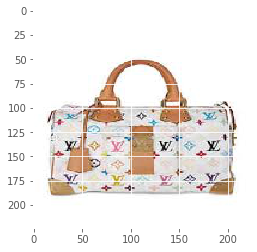

-----------------------------------------------------------------------
Most Similar Products:


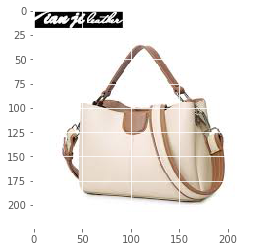

Similarity score :  0.7201479


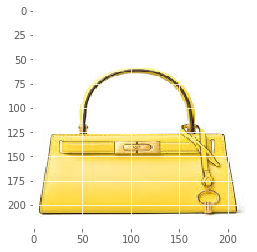

Similarity score :  0.71967477


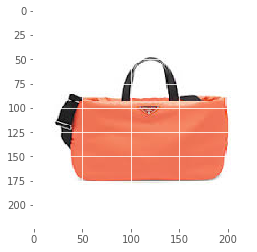

Similarity score :  0.706241


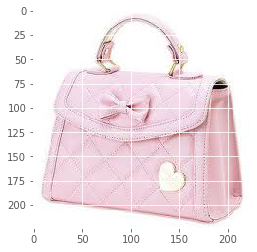

Similarity score :  0.70353895


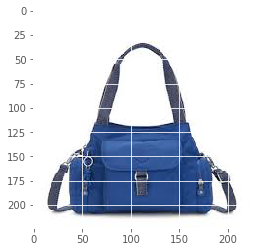

Similarity score :  0.69797635
-----------------------------------------------------------------------
Original Product:


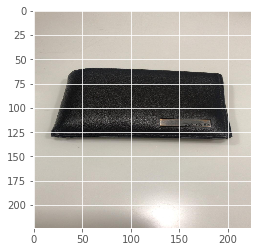

-----------------------------------------------------------------------
Most Similar Products:


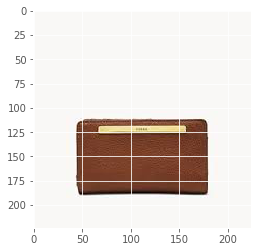

Similarity score :  0.7028943


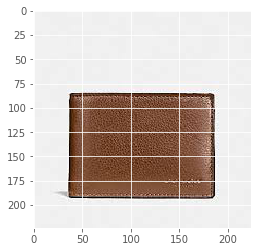

Similarity score :  0.6997423


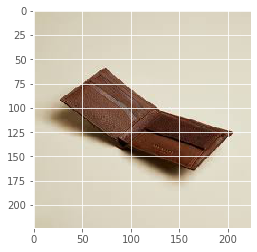

Similarity score :  0.69213784


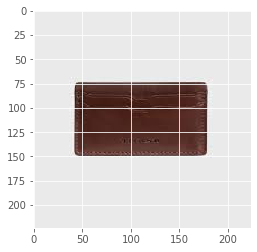

Similarity score :  0.69135076


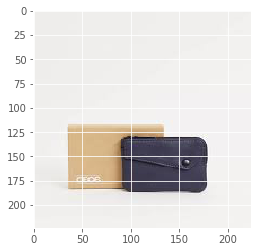

Similarity score :  0.67853844
-----------------------------------------------------------------------
Original Product:


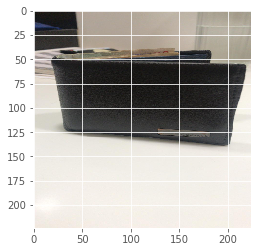

-----------------------------------------------------------------------
Most Similar Products:


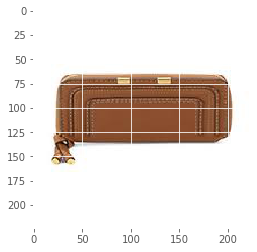

Similarity score :  0.53410333


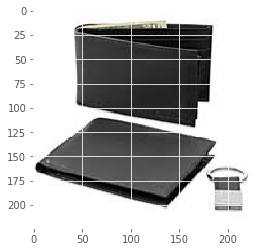

Similarity score :  0.5315226


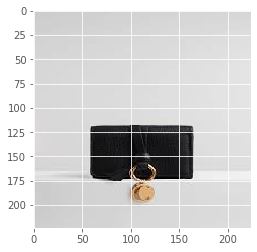

Similarity score :  0.5296507


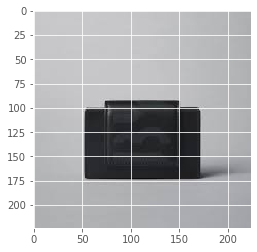

Similarity score :  0.5257903


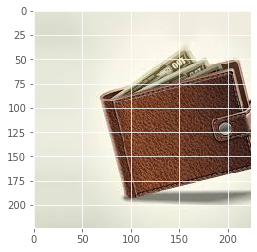

Similarity score :  0.5232432
-----------------------------------------------------------------------
Original Product:


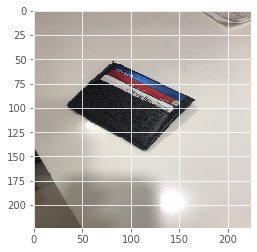

-----------------------------------------------------------------------
Most Similar Products:


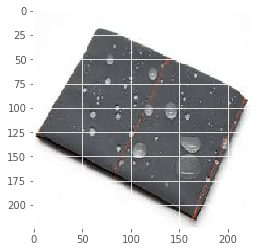

Similarity score :  0.5566435


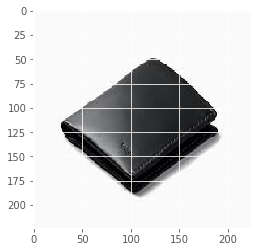

Similarity score :  0.555621


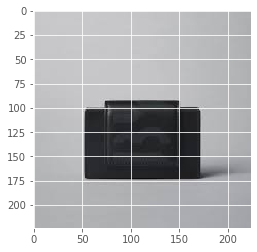

Similarity score :  0.5516311


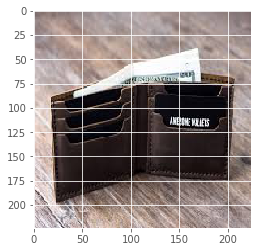

Similarity score :  0.5464511


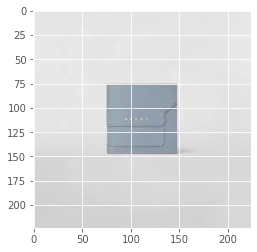

Similarity score :  0.54284805


In [160]:
findallsim(files_test3)

# Men's Tshirt

In [161]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test4=choosecat('Men\'s Tshirt')
test_image_features=preprocessimg(files_test4)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test4)
cos_similarities_df.head()

number of images: 5


,test/Men's Tshirt/608.jpg,test/Men's Tshirt/610.jpg,test/Men's Tshirt/630.jpg,test/Men's Tshirt/WhatsApp Image 2020-08-07 at 2.23.41 PM (1).jpeg,test/Men's Tshirt/WhatsApp Image 2020-08-07 at 2.23.42 PM.jpeg
train/1.jpg,0.120114,0.153418,0.148979,0.115635,0.113859
train/10.jpg,0.142275,0.135922,0.130340,0.182443,0.153499
train/100.jpg,0.174741,0.289054,0.261833,0.313605,0.284886
train/1003.jpg,0.161888,0.251520,0.292960,0.296017,0.271948
train/1004.jpg,0.340747,0.368905,0.369306,0.334533,0.441054


-----------------------------------------------------------------------
Original Product:


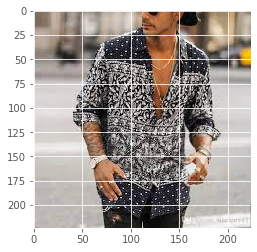

-----------------------------------------------------------------------
Most Similar Products:


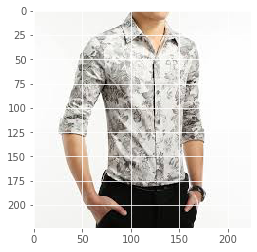

Similarity score :  0.58746934


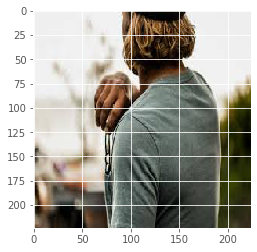

Similarity score :  0.5303389


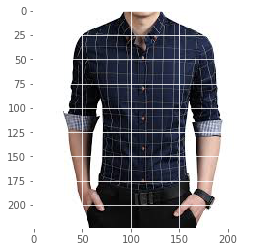

Similarity score :  0.52180576


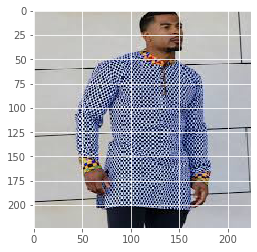

Similarity score :  0.51780945


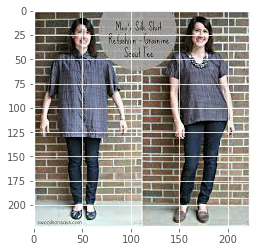

Similarity score :  0.51567894
-----------------------------------------------------------------------
Original Product:


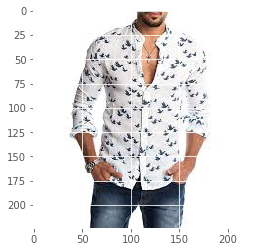

-----------------------------------------------------------------------
Most Similar Products:


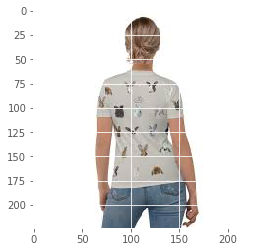

Similarity score :  0.78837603


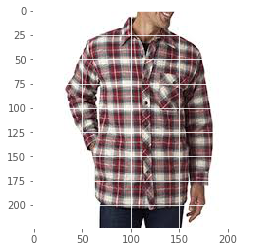

Similarity score :  0.77779293


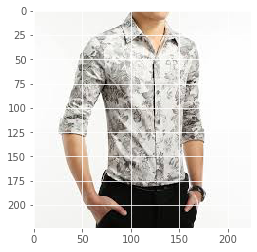

Similarity score :  0.7323972


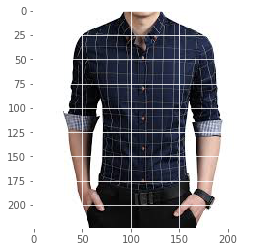

Similarity score :  0.72988826


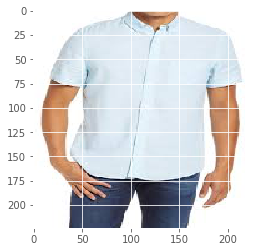

Similarity score :  0.7284325
-----------------------------------------------------------------------
Original Product:


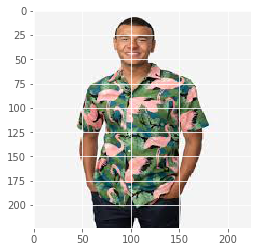

-----------------------------------------------------------------------
Most Similar Products:


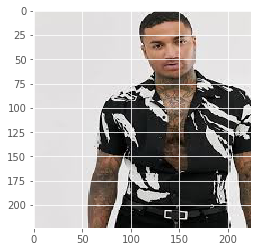

Similarity score :  0.7083157


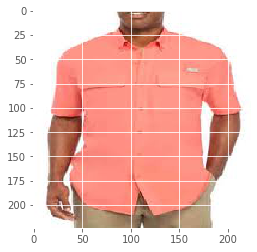

Similarity score :  0.7027083


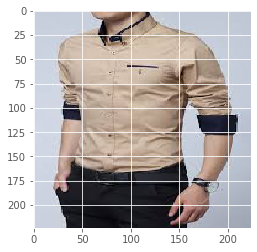

Similarity score :  0.702266


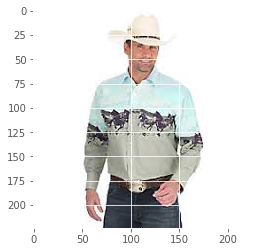

Similarity score :  0.69290066


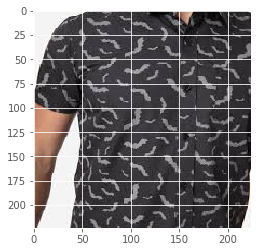

Similarity score :  0.6581394
-----------------------------------------------------------------------
Original Product:


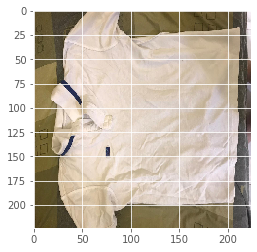

-----------------------------------------------------------------------
Most Similar Products:


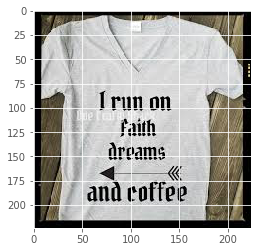

Similarity score :  0.55329835


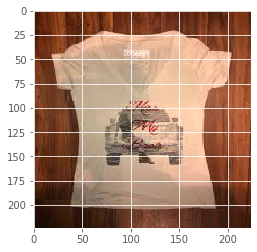

Similarity score :  0.5083941


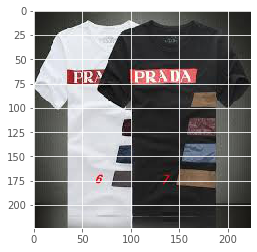

Similarity score :  0.49858755


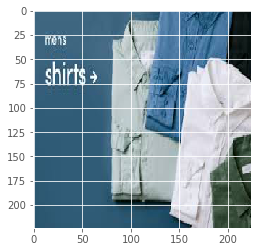

Similarity score :  0.49450013


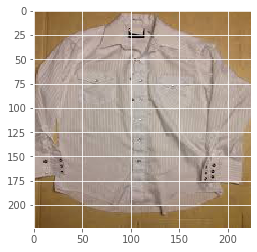

Similarity score :  0.49268755
-----------------------------------------------------------------------
Original Product:


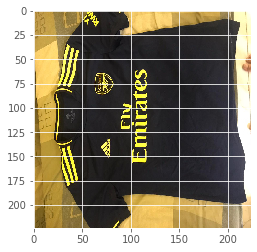

-----------------------------------------------------------------------
Most Similar Products:


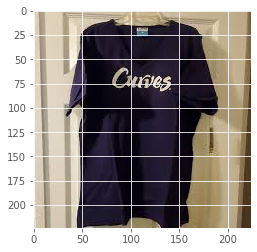

Similarity score :  0.619053


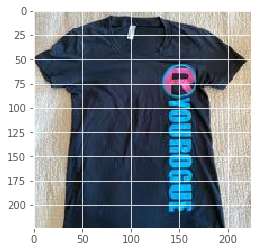

Similarity score :  0.6158244


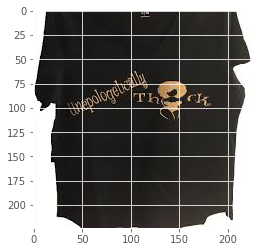

Similarity score :  0.5958734


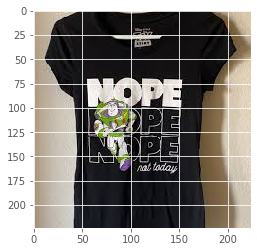

Similarity score :  0.5845226


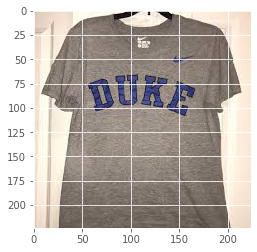

Similarity score :  0.5825789


In [162]:
findallsim(files_test4)

# Women's Tshirt

In [163]:
#Preprocessing and feature extraction
# For running just copy the variable for the category 
files_test5=choosecat('Women\'s Tshirt')
test_image_features=preprocessimg(files_test5)
test_image_features.shape
# Cosine Similarity
cos_similarities_df=findcossim(X,test_image_features,files_test5)
cos_similarities_df.head()

number of images: 5


,test/Women's Tshirt/1091.jpg,test/Women's Tshirt/1119.jpg,test/Women's Tshirt/1167.jpg,test/Women's Tshirt/WhatsApp Image 2020-08-07 at 2.40.05 PM (3).jpeg,test/Women's Tshirt/WhatsApp Image 2020-08-07 at 2.40.05 PM (4).jpeg
train/1.jpg,0.191942,0.209339,0.179056,0.117516,0.155469
train/10.jpg,0.219642,0.188024,0.136013,0.148678,0.134910
train/100.jpg,0.319912,0.283790,0.276691,0.244329,0.279772
train/1003.jpg,0.301405,0.367663,0.290159,0.205860,0.247349
train/1004.jpg,0.415536,0.423268,0.361530,0.391287,0.336883


-----------------------------------------------------------------------
Original Product:


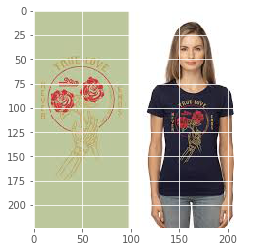

-----------------------------------------------------------------------
Most Similar Products:


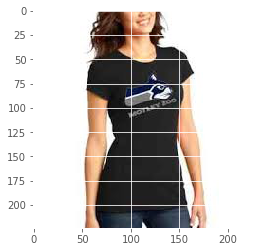

Similarity score :  0.81222945


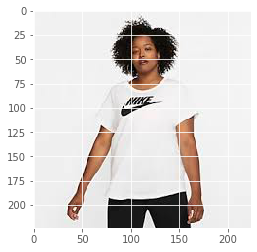

Similarity score :  0.7867539


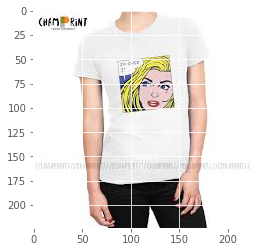

Similarity score :  0.7845281


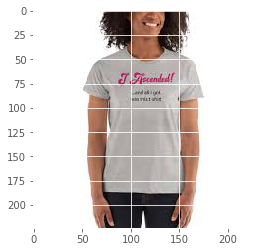

Similarity score :  0.7832058


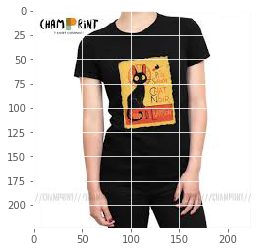

Similarity score :  0.7824191
-----------------------------------------------------------------------
Original Product:


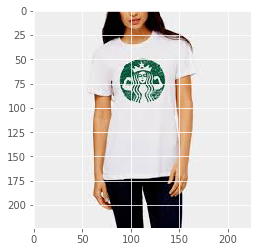

-----------------------------------------------------------------------
Most Similar Products:


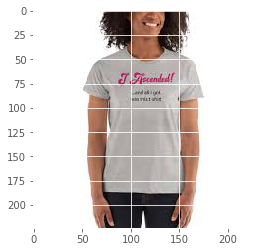

Similarity score :  0.83295375


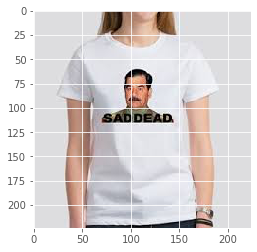

Similarity score :  0.8277565


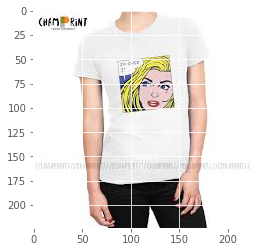

Similarity score :  0.8265266


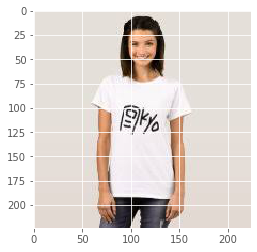

Similarity score :  0.822854


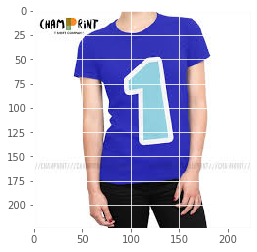

Similarity score :  0.8149468
-----------------------------------------------------------------------
Original Product:


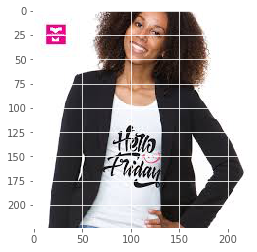

-----------------------------------------------------------------------
Most Similar Products:


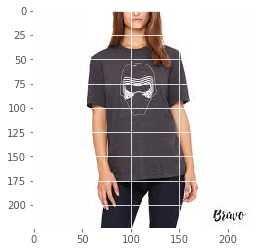

Similarity score :  0.7219703


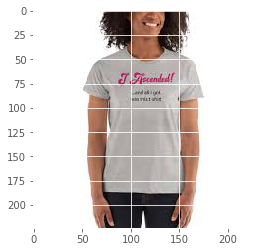

Similarity score :  0.71637523


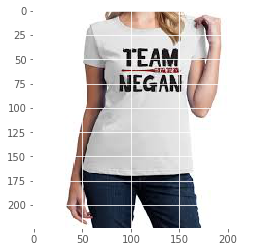

Similarity score :  0.7107385


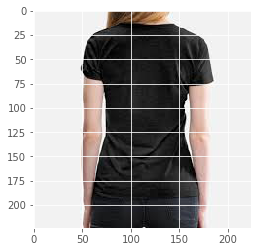

Similarity score :  0.7090855


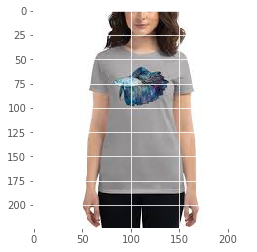

Similarity score :  0.70442927
-----------------------------------------------------------------------
Original Product:


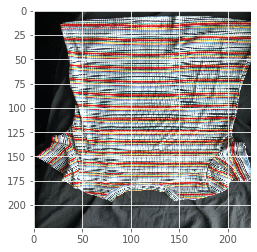

-----------------------------------------------------------------------
Most Similar Products:


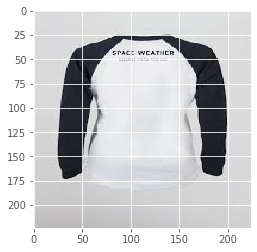

Similarity score :  0.449282


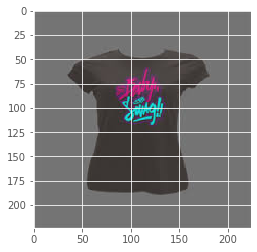

Similarity score :  0.44582283


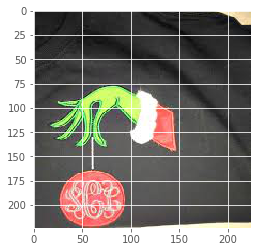

Similarity score :  0.4359972


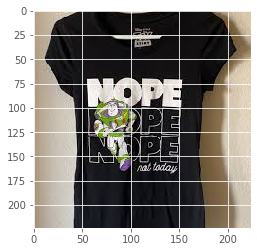

Similarity score :  0.4163087


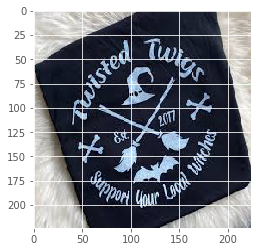

Similarity score :  0.4133351
-----------------------------------------------------------------------
Original Product:


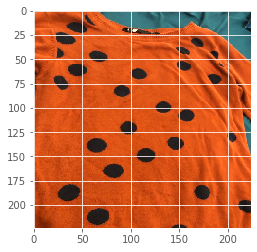

-----------------------------------------------------------------------
Most Similar Products:


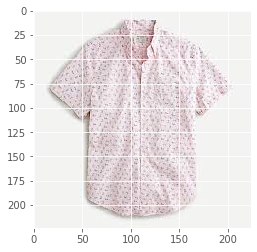

Similarity score :  0.4611037


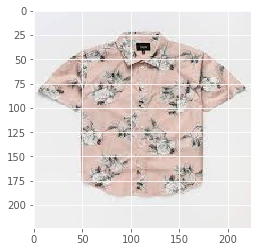

Similarity score :  0.45769835


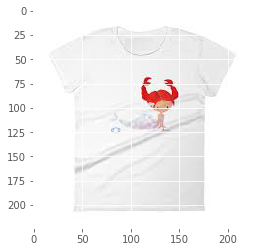

Similarity score :  0.45739907


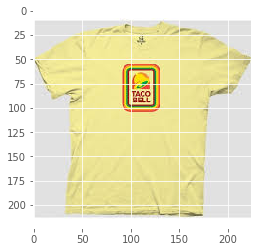

Similarity score :  0.4533592


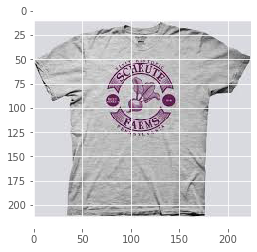

Similarity score :  0.4515072


In [164]:
findallsim(files_test5)

# Summary:
This works best if a business is setting up its e-commerce website for the first time and does not have user-item purchase/rating history to start with initally. This recommendation system will help the users get a good recommendation to start with and once the buyers have a purchased history, the recommendation engine can use the model based collaborative filtering technique.